In [ ]:
import marimo as mo

### In this Lab, we’ll understand the audio preprocessing pipeline.

In the first section, we will explore different ways to represent audio signals, including time-domain signals, FFTs, spectrograms, and MFCC-style Mel features. In the second section, we will use a keyword spotting model, convert it to TensorFlow Lite, apply full integer post-training quantization, test the quantized model, and export the model as a C/C++ array for Arduino deployment.

**Local environment version.** This notebook is edited to run in the TinyML Python environment created for this class, rather than depending on Google Colab-specific commands. It still supports recording your own voice from the laptop microphone, loading example audio, visualizing features, evaluating the quantized model, and generating the `kws.cc` file for Arduino.

# 1. Spectrograms and MFCCs

### Install required packages

The TinyML environment already installs TensorFlow, NumPy, SciPy, Matplotlib, Jupyter, and the main course dependencies. This notebook installs only the small audio-recording/audio-processing packages needed for Lab 5.

We use the following additional packages:

1. `librosa` for audio loading and resampling.
2. `sounddevice` for local microphone recording.
3. `soundfile` for audio file support used by `librosa`.

In [ ]:
# Run this cell once inside the class TinyML environment.
# In Jupyter, %pip installs packages into the currently selected kernel environment.

# '%pip install -q librosa sounddevice soundfile' command supported automatically in marimo

import importlib
for pkg in ("librosa", "sounddevice", "soundfile"):
    importlib.import_module(pkg)
print("Lab 5 audio packages are ready.")

Lab 5 audio packages are ready.


### Import everything we will need

1. `IPython.display.Audio` lets us play audio clips inside the notebook.
2. `NumPy`, `SciPy`, and `Librosa` are used for signal processing and audio resampling.
3. `TensorFlow` is used for the keyword spotting model and TensorFlow Lite conversion.
4. `Matplotlib` is used for plotting waveforms, spectra, spectrograms, and Mel features.

In [ ]:
from IPython.display import Audio, display
import os
import sys
import tarfile
import zipfile
import shutil
import glob
from urllib.request import urlretrieve
from pathlib import Path
import subprocess

os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

import numpy as np
import scipy
import scipy.io.wavfile
from scipy import signal

import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib import cm
import pickle
import librosa
import sounddevice as sd

print("Packages imported successfully.")
print("TensorFlow version:", tf.__version__)
print("Python executable:", sys.executable)

2026-07-23 17:47:19.895372: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-07-23 17:47:19.915686: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-07-23 17:47:19.915715: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-07-23 17:47:19.915735: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-07-23 17:47:19.919924: I tensorflow/core/platform/cpu_feature_g

Packages imported successfully.
TensorFlow version: 2.14.1
Python executable: /home/vkut/Documents/uni/tinyml/tinyml-arduino/bin/python3


### Define the audio importing function

The cell below defines a local microphone recorder. When you run a recording cell, press Enter when prompted, say the target word clearly, and wait until the recording finishes.

If macOS asks for microphone permission, allow Terminal, your browser, or the application used to launch Jupyter.

In [ ]:
def _normalize_to_int16(audio):
    """Convert a mono/stereo NumPy audio array to int16 mono audio."""
    audio = np.asarray(audio)

    # Convert stereo/multichannel to mono.
    if audio.ndim == 2:
        audio = audio.mean(axis=1)

    audio = audio.astype(np.float32)

    # If audio is already in int16-like scale, normalize it safely.
    max_abs = np.max(np.abs(audio)) if audio.size else 0.0
    if max_abs == 0:
        return audio.astype(np.int16)

    if max_abs <= 1.5:
        audio = audio * 32767.0
    else:
        audio = audio / max_abs * 32767.0

    return np.clip(audio, -32768, 32767).astype(np.int16)


def get_audio(duration_seconds=1.5, sample_rate=16000):
    """
    Record audio from the local microphone.

    Parameters
    ----------
    duration_seconds : float
        Recording duration. 1.5 seconds is usually enough for one short keyword.
    sample_rate : int
        Sampling rate in Hz. The KWS model expects 16 kHz audio.

    Returns
    -------
    audio : np.ndarray
        Mono int16 audio.
    sr : int
        Sampling rate.
    """
    input(f"Press Enter, then say one keyword clearly. Recording will last {duration_seconds:.1f} seconds...")
    print("Recording...")
    recording = sd.rec(
        int(duration_seconds * sample_rate),
        samplerate=sample_rate,
        channels=1,
        dtype="float32",
    )
    sd.wait()
    audio = _normalize_to_int16(recording[:, 0])
    print("Recording complete.")
    display(Audio(audio, rate=sample_rate))
    return audio, sample_rate


def load_audio_file(path, target_sr=None):
    """
    Optional fallback: load a saved audio file instead of recording live audio.
    Example:
        audio, sr = load_audio_file("my_yes.wav", target_sr=16000)
    """
    audio, sr = librosa.load(path, sr=target_sr, mono=True)
    return _normalize_to_int16(audio), sr


print("Local microphone recorder defined.")

Local microphone recorder defined.


### **[B] Load in default audio samples**

We download a pickle file from GitHub that contains default audio samples. These samples are useful if you do not want to use your own recorded samples for the first visualization part.

The following cell downloads `audio_files.pkl` using Python, so it works in the local TinyML environment without needing Colab, `wget`, or Linux-specific shell commands.

In [ ]:
AUDIO_FILE_URL = "https://github.com/tinyMLx/colabs/raw/master/audio_files.pkl"
AUDIO_FILE_PATH = Path("./assets/audio/audio_files.pkl")

if not AUDIO_FILE_PATH.exists():
    AUDIO_FILE_PATH.parent.mkdir(parents=True, exist_ok=True)
    print("Downloading audio_files.pkl...")
    urlretrieve(AUDIO_FILE_URL, AUDIO_FILE_PATH)
else:
    print("audio_files.pkl already exists.")

print("Default audio sample file is ready:", AUDIO_FILE_PATH.resolve())

audio_files.pkl already exists.
Default audio sample file is ready: /home/vkut/Documents/uni/tinyml/labs/lab5/assets/audio/audio_files.pkl


In [ ]:
with open('./assets/audio/audio_files.pkl', 'rb') as _f:
    _audio_files = pickle.load(_f) # python dictionary

audio_yes_loud = _audio_files['audio_yes_loud']
sr_yes_loud = _audio_files['sr_yes_loud']
audio_yes_quiet = _audio_files['audio_yes_quiet']
sr_yes_quiet = _audio_files['sr_yes_quiet']
audio_no_loud = _audio_files['audio_no_loud']
sr_no_loud = _audio_files['sr_no_loud']
audio_no_quiet = _audio_files['audio_no_quiet']
sr_no_quiet = _audio_files['sr_no_quiet']

### Inspect audio sample

In [ ]:
print("audio_yes_loud:", audio_yes_loud)
print("type:", type(audio_yes_loud))
print("shape:", audio_yes_loud.shape)

audio_yes_loud: [  0   0   0 ... -10  -8  -4]
type: <class 'numpy.ndarray'>
shape: (83520,)


### Listen to Loaded Audio Samples
You can hear the audio files you just loaded below. IPython gives us a widget to play audio files through a notebook.

***Note*** - the loud yes and no audio could be too loud!

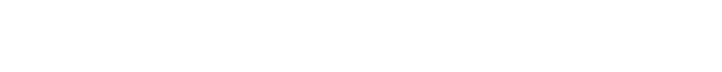

In [ ]:
Audio(audio_yes_loud, rate=sr_yes_loud)

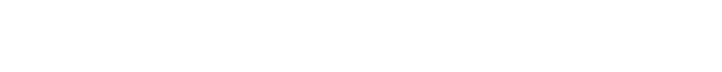

In [ ]:
Audio(audio_yes_quiet, rate=sr_yes_quiet)

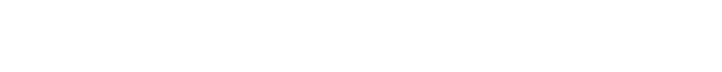

In [ ]:
Audio(audio_no_loud, rate=sr_no_loud)

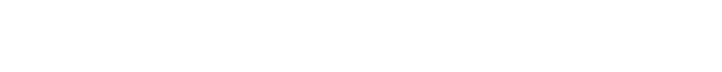

In [ ]:
Audio(audio_no_quiet, rate=sr_no_quiet)

### Visualize the samples
[A] We will first visualize the audio samples as **signals**.

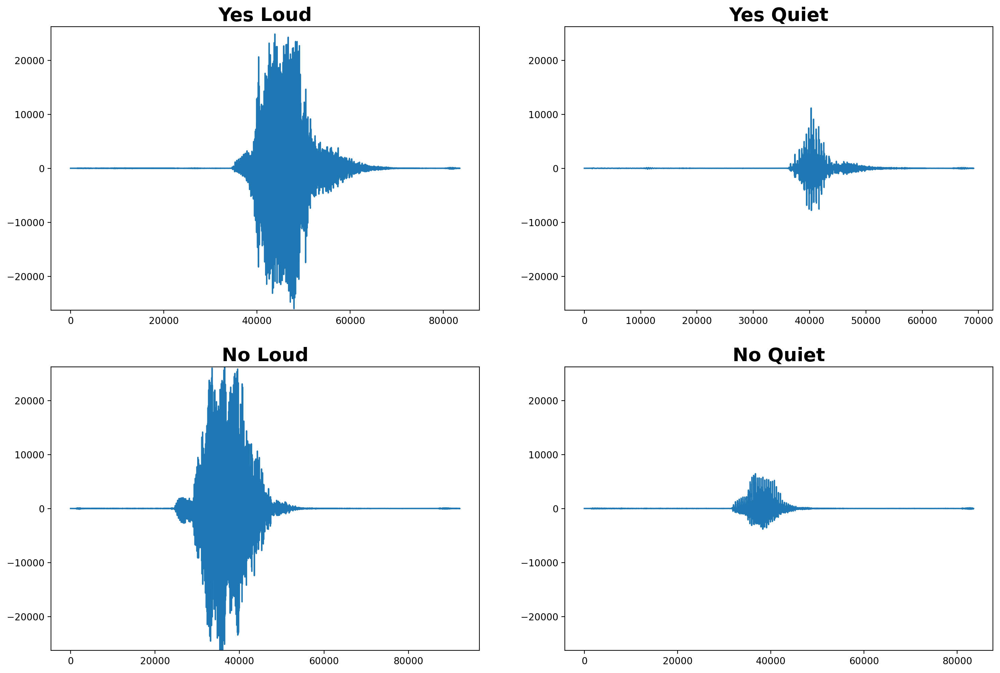

In [ ]:
# Plot the figure (axes - 10e-5)
_fig, ((_ax1, _ax2), (_ax3, _ax4)) = plt.subplots(nrows=2, ncols=2)
_max_val = max(np.append(np.append(np.append(audio_yes_loud, audio_yes_quiet), audio_no_loud), audio_no_quiet))  # for y-axis range
_ax1.plot(audio_yes_loud)
_ax1.set_title('Yes Loud', {'fontsize': 20, 'fontweight': 'bold'})
_ax1.set_ylim(-_max_val, _max_val)
_ax2.plot(audio_yes_quiet)
_ax2.set_title('Yes Quiet', {'fontsize': 20, 'fontweight': 'bold'})
_ax2.set_ylim(-_max_val, _max_val)
_ax3.plot(audio_no_loud)
_ax3.set_title('No Loud', {'fontsize': 20, 'fontweight': 'bold'})
_ax3.set_ylim(-_max_val, _max_val)
_ax4.plot(audio_no_quiet)
_ax4.set_title('No Quiet', {'fontsize': 20, 'fontweight': 'bold'})
_ax4.set_ylim(-_max_val, _max_val)
_fig.set_size_inches(18, 12)
plt.show()

[B] Next, we will view the Fourier Transform of the signal i.e., the **signal in the frequency domain**. We will use `numpy.fft.fft()` for this. You can read more about the API [here](https://numpy.org/doc/stable/reference/generated/numpy.fft.fft.html).

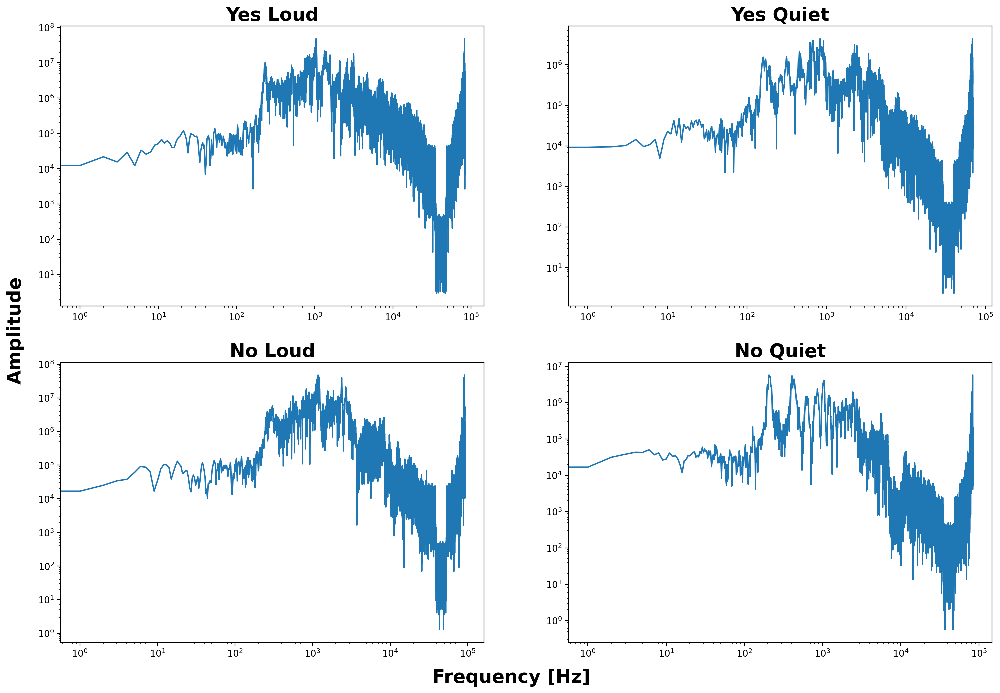

In [ ]:
# compute the FFT and take the single-sided spectrum only - computes magnitude of complex number
_fig, ((_ax1, _ax2), (_ax3, _ax4)) = plt.subplots(nrows=2, ncols=2)
ft_audio_yes_loud = np.abs(2 * np.fft.fft(audio_yes_loud))
ft_audio_yes_quiet = np.abs(2 * np.fft.fft(audio_yes_quiet))  # numpy.abs() gives magnitude of a complex number
ft_audio_no_loud = np.abs(2 * np.fft.fft(audio_no_loud))
ft_audio_no_quiet = np.abs(2 * np.fft.fft(audio_no_quiet))
_ax1.plot(ft_audio_yes_loud)
_ax1.set_xscale('log')
# Plot the figure
_ax1.set_yscale('log')
_ax1.set_title('Yes Loud', {'fontsize': 20, 'fontweight': 'bold'})
_ax2.plot(ft_audio_yes_quiet)
_ax2.set_xscale('log')
_ax2.set_yscale('log')
_ax2.set_title('Yes Quiet', {'fontsize': 20, 'fontweight': 'bold'})
_ax3.plot(ft_audio_no_loud)
_ax3.set_xscale('log')
_ax3.set_yscale('log')
_ax3.set_title('No Loud', {'fontsize': 20, 'fontweight': 'bold'})
_ax4.plot(ft_audio_no_quiet)
_ax4.set_xscale('log')
_ax4.set_yscale('log')
_ax4.set_title('No Quiet', {'fontsize': 20, 'fontweight': 'bold'})
_fig.set_size_inches(18, 12)
_fig.text(0.5, 0.06, 'Frequency [Hz]', {'fontsize': 20, 'fontweight': 'bold'}, ha='center')
_fig.text(0.08, 0.5, 'Amplitude', {'fontsize': 20, 'fontweight': 'bold'}, va='center', rotation='vertical')
plt.show()

[C] Next, we will visualize the audio samples as spectrograms. We will be using `tfio.audio.spectrogram()` for this. You can read more about the API [here](https://www.tensorflow.org/io/api_docs/python/tfio/audio/spectrogram).

The implementation was adapted from -

Can you see how spectrograms can help machine learning models better differentiate between audio samples?

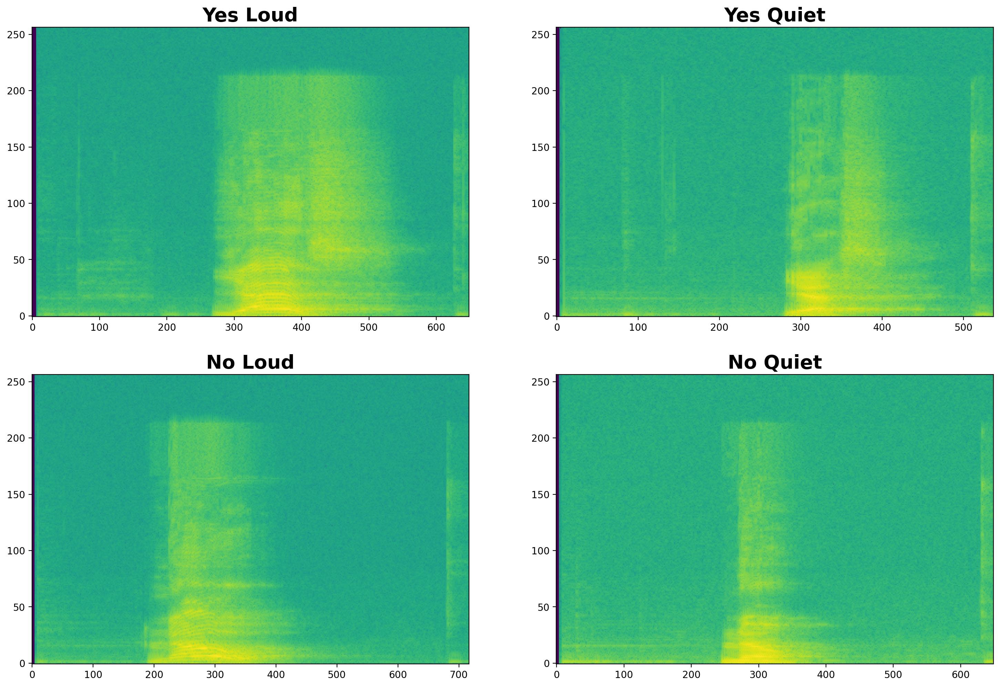

In [ ]:
# Convert to spectrogram and display.
# This local version uses scipy.signal.spectrogram instead of tensorflow-io.
def compute_log_spectrogram(audio, sr, nperseg=512, noverlap=384):
    audio = np.asarray(audio, dtype=np.float32)
    if audio.ndim == 2:
        audio = audio.mean(axis=1)
    # Standard constraint: noverlap must be strictly less than nperseg
    noverlap = min(noverlap, nperseg - 1)
    f, t, Sxx = signal.spectrogram(
        audio,
        fs=sr,
        nperseg=min(nperseg, len(audio)),
        noverlap=noverlap,
        scaling="spectrum",
        mode="magnitude",
    )
    return np.log(Sxx + 1e-10)

spectrogram_yes_loud = compute_log_spectrogram(audio_yes_loud, sr_yes_loud)
spectrogram_yes_quiet = compute_log_spectrogram(
    audio_yes_quiet, sr_yes_quiet
)
spectrogram_no_loud = compute_log_spectrogram(audio_no_loud, sr_no_loud)
spectrogram_no_quiet = compute_log_spectrogram(audio_no_quiet, sr_no_quiet)

_fig, ((_ax1, _ax2), (_ax3, _ax4)) = plt.subplots(nrows=2, ncols=2)
_ax1.imshow(spectrogram_yes_loud, aspect="auto", origin="lower")
_ax1.set_title("Yes Loud", {"fontsize": 20, "fontweight": "bold"})
_ax2.imshow(spectrogram_yes_quiet, aspect="auto", origin="lower")
_ax2.set_title("Yes Quiet", {"fontsize": 20, "fontweight": "bold"})
_ax3.imshow(spectrogram_no_loud, aspect="auto", origin="lower")
_ax3.set_title("No Loud", {"fontsize": 20, "fontweight": "bold"})
_ax4.imshow(spectrogram_no_quiet, aspect="auto", origin="lower")
_ax4.set_title("No Quiet", {"fontsize": 20, "fontweight": "bold"})

_fig.set_size_inches(18, 12)
plt.show()

[D] Finally, we will visualize the audio samples as **MFCCs** thereby using the Mel Scale to better associate the features to human hearing! We use the librosa library to achieve this. You can read more about the APIs we use here - [Link1](https://librosa.org/doc/main/generated/librosa.feature.melspectrogram.html), [Link2](https://librosa.org/doc/main/generated/librosa.power_to_db.html). This implementation was adapted from -

1.   https://towardsdatascience.com/getting-to-know-the-mel-spectrogram-31bca3e2d9d0

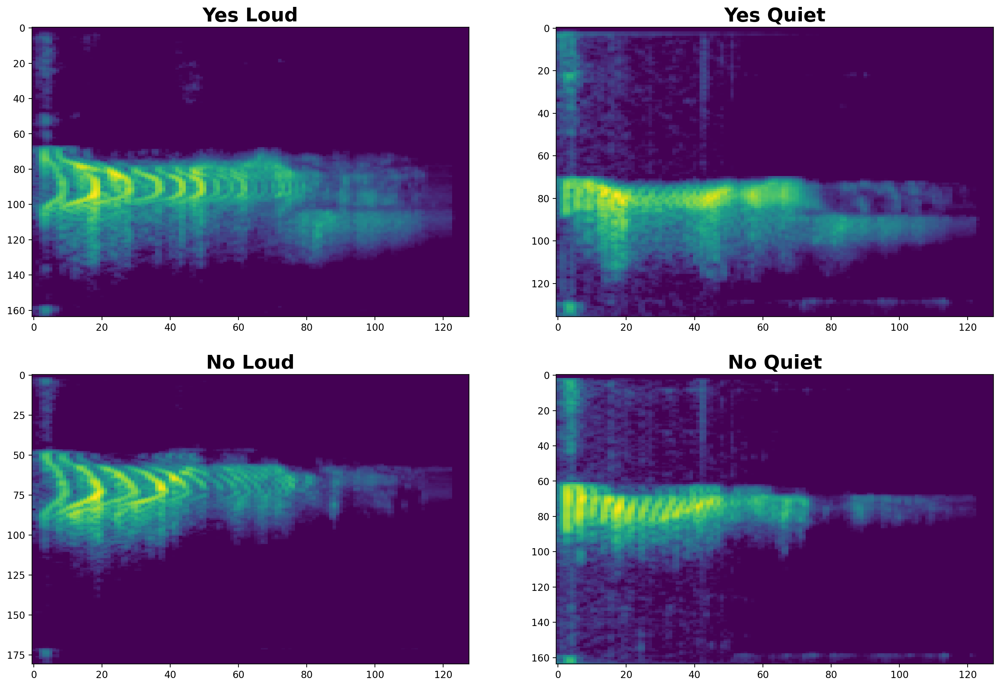

In [ ]:
# Convert to MFCC using the Mel Scale
mfcc_yes_loud = librosa.power_to_db(
    librosa.feature.melspectrogram(
        y=np.float32(audio_yes_loud),
        sr=sr_yes_loud,
        n_fft=2048,
        hop_length=512,
        n_mels=128,
    ),
    ref=np.max,
)
mfcc_yes_quiet = librosa.power_to_db(
    librosa.feature.melspectrogram(
        y=np.float32(audio_yes_quiet),
        sr=sr_yes_quiet,
        n_fft=2048,
        hop_length=512,
        n_mels=128,
    ),
    ref=np.max,
)
mfcc_no_loud = librosa.power_to_db(
    librosa.feature.melspectrogram(
        y=np.float32(audio_no_loud),
        sr=sr_no_loud,
        n_fft=2048,
        hop_length=512,
        n_mels=128,
    ),
    ref=np.max,
)
mfcc_no_quiet = librosa.power_to_db(
    librosa.feature.melspectrogram(
        y=np.float32(audio_no_quiet),
        sr=sr_no_quiet,
        n_fft=2048,
        hop_length=512,
        n_mels=128,
    ),
    ref=np.max,
)
_fig, ((_ax1, _ax2), (_ax3, _ax4)) = plt.subplots(nrows=2, ncols=2)
_ax1.imshow(
    np.swapaxes(mfcc_yes_loud, 0, 1),
    interpolation="nearest",
    cmap=cm.viridis,
    origin="lower",
    aspect="auto",
)
_ax1.set_title("Yes Loud", {"fontsize": 20, "fontweight": "bold"})
_ax1.set_ylim(_ax1.get_ylim()[::-1])
_ax2.imshow(
    np.swapaxes(mfcc_yes_quiet, 0, 1),
    interpolation="nearest",
    cmap=cm.viridis,
    origin="lower",
    aspect="auto",
)
_ax2.set_title("Yes Quiet", {"fontsize": 20, "fontweight": "bold"})
# Plot the figure
_ax2.set_ylim(_ax2.get_ylim()[::-1])
_ax3.imshow(
    np.swapaxes(mfcc_no_loud, 0, 1),
    interpolation="nearest",
    cmap=cm.viridis,
    origin="lower",
    aspect="auto",
)
_ax3.set_title("No Loud", {"fontsize": 20, "fontweight": "bold"})
_ax3.set_ylim(_ax3.get_ylim()[::-1])
_ax4.imshow(
    np.swapaxes(mfcc_no_quiet, 0, 1),
    interpolation="nearest",
    cmap=cm.viridis,
    origin="lower",
    aspect="auto",
)
_ax4.set_title("No Quiet", {"fontsize": 20, "fontweight": "bold"})
_ax4.set_ylim(_ax4.get_ylim()[::-1])
_fig.set_size_inches(18, 12)
plt.show()

# 2. Keyword Spotting Model
In this section we will see how well a default pre-trained model works for the Keyword Spotting application.

This notebook uses a pre-trained 20 kB model based on [Simple Audio Recognition](https://www.tensorflow.org/tutorials/audio/simple_audio) to recognize keywords! The model is derived from a [micro_speech](https://github.com/tensorflow/tensorflow/tree/v2.4.1/tensorflow/lite/micro/examples/micro_speech) example for [TensorFlow Lite for MicroControllers](https://www.tensorflow.org/lite/microcontrollers/overview)

### Import Libraries
We import the following libraries.

In [ ]:
TF_VERSION = "2.14.1"
SPEECH_COMMANDS_DIR = Path("./assets/tf/speech_commands")
SPEECH_COMMANDS_DIR.mkdir(parents=True, exist_ok=True)

(SPEECH_COMMANDS_DIR / "__init__.py").touch()

files_to_download = [
    "freeze.py",
    "input_data.py",
    "models.py",
]

base_url = f"https://raw.githubusercontent.com/tensorflow/tensorflow/v{TF_VERSION}/tensorflow/examples/speech_commands/"

for fname in files_to_download:
    target_path = SPEECH_COMMANDS_DIR / fname
    if not target_path.exists():
        print(f"Downloading {fname}...")
        urlretrieve(base_url + fname, target_path)
    else:
        print(f"{fname} already exists.")

print("Speech command helper modules ready at:", SPEECH_COMMANDS_DIR.resolve())

freeze.py already exists.
input_data.py already exists.
models.py already exists.
Speech command helper modules ready at: /home/vkut/Documents/uni/tinyml/labs/lab5/assets/tf/speech_commands


In [ ]:
sys.path.insert(0, str(SPEECH_COMMANDS_DIR.resolve()))
# Add this path so we can import the TensorFlow speech command helper modules.
import input_data
import models
print('Speech command helper modules imported.')

Speech command helper modules imported.


The TensorFlow source folder contains the speech command preprocessing and model helper code used in this lab. In this local version, the source is downloaded with Python and stored in the notebook folder under `tensorflow/`.

### Configure Defaults
In the below cell, we define the words we want to train our model on. We define a comma-delimited list of the words you want to train for. All the other words you do not select will be used to train an "unknown" label so that the model does not just recognize speech but your specific words. Audio data with no spoken words will be used to train a "silence" label.

In [ ]:
WANTED_WORDS = "yes,no"

# Print the configuration to confirm it
print("Spotting these words: %s" % WANTED_WORDS)

Spotting these words: yes,no


We will use the default configurations to use the pre-trained model. **DO NOT MODIFY** the following constants as they include filepaths used in this notebook and data that is shared during training and inference.

In [ ]:
# Calculate the percentage of 'silence' and 'unknown' training samples required
# to ensure that we have equal number of samples for each label.
number_of_labels = WANTED_WORDS.count(',') + 1
number_of_total_labels = number_of_labels + 2  # count() counts the number of commas (substr provided)
equal_percentage_of_training_samples = int(100.0 / number_of_total_labels)  # for 'silence' and 'unknown' label

SILENT_PERCENTAGE = equal_percentage_of_training_samples
UNKNOWN_PERCENTAGE = equal_percentage_of_training_samples

PREPROCESS = 'micro'
WINDOW_STRIDE = 20
MODEL_ARCHITECTURE = 'tiny_conv'

# Constants which are shared during training and inference
DATASET_DIR = Path('./assets/dataset/')
LOGS_DIR = Path('./assets/logs/')
TRAIN_DIR = Path('./assets/train/')
MODELS_DIR = Path('./assets/models/')

for directory in (DATASET_DIR, LOGS_DIR, TRAIN_DIR, MODELS_DIR):
    directory.mkdir(parents=True, exist_ok=True)

MODEL_TF = MODELS_DIR / 'model.pb'
MODEL_TFLITE = MODELS_DIR / 'model.tflite'  # for training checkpoints and other files.
FLOAT_MODEL_TFLITE = MODELS_DIR / 'float_model.tflite'
MODEL_TFLITE_MICRO = MODELS_DIR / 'model.cc'

# Constants for inference directories and filepaths
SAVED_MODEL = MODELS_DIR / 'saved_model'

QUANT_INPUT_MIN = 0.0
QUANT_INPUT_MAX = 26.0
QUANT_INPUT_RANGE = QUANT_INPUT_MAX - QUANT_INPUT_MIN

SAMPLE_RATE = 16000
CLIP_DURATION_MS = 1000
WINDOW_SIZE_MS = 30.0
FEATURE_BIN_COUNT = 40
BACKGROUND_FREQUENCY = 0.8
BACKGROUND_VOLUME_RANGE = 0.1
TIME_SHIFT_MS = 100.0

# Constants for Quantization
DATA_URL = 'https://storage.googleapis.com/download.tensorflow.org/data/speech_commands_v0.02.tar.gz'
VALIDATION_PERCENTAGE = 10

# Constants for audio process during Quantization and Evaluation
# URL for the dataset and train/val/test split
TESTING_PERCENTAGE = 10

### Loading the pre-trained model

These commands will download a pre-trained model checkpoint file (the output from training) that we can use to build a model. You can read more about saving model checkpoints and using it for subsequent model inference here - [Link1](https://www.tensorflow.org/tutorials/keras/save_and_load), [Link2](https://www.tensorflow.org/guide/checkpoint)

You should see a train/ folder on the left tab. It contains the checkpoint and metadata.

In [ ]:
PRETRAINED_MODEL_URL = "https://storage.googleapis.com/download.tensorflow.org/models/tflite/speech_micro_train_2020_05_10.tgz"
PRETRAINED_MODEL_ARCHIVE = Path("assets/speech_micro_train_2020_05_10.tgz")

if not PRETRAINED_MODEL_ARCHIVE.exists():
    print("Downloading pretrained keyword spotting checkpoint...")
    urlretrieve(PRETRAINED_MODEL_URL, PRETRAINED_MODEL_ARCHIVE)
else:
    print("Pretrained checkpoint archive already exists.")

print("Extracting pretrained checkpoint...")
with tarfile.open(PRETRAINED_MODEL_ARCHIVE, "r:gz") as _tar:
    _tar.extractall("./assets")

# auto-detect the latest checkpoint step instead of hardcoding 15000
ckpts = sorted(glob.glob(str(Path("./assets/train/tiny_conv.ckpt-*"))))
TOTAL_STEPS = ckpts[-1].rsplit("-", 1)[-1].rsplit(".")[0] if ckpts else 15000
print(f"Pretrained checkpoint is ready (Detected step {TOTAL_STEPS}).")

Pretrained checkpoint archive already exists.
Extracting pretrained checkpoint...
Pretrained checkpoint is ready (Detected step 15000).


### Generate a TensorFlow Model for Inference

Below, we combine relevant training results (graph, weights, etc) into a single file for inference. This process is known as **freezing** a model and the resulting model is known as a frozen model/graph, as it cannot be further re-trained after this process.

We run the freeze.py script to achieve this.

After running this cell, you should find the saved model under models/ in the left tab.

In [ ]:
# Remove any previous SavedModel and regenerate it from the pretrained checkpoint.
if Path(SAVED_MODEL).exists():
    shutil.rmtree(SAVED_MODEL)

freeze_script = SPEECH_COMMANDS_DIR / 'freeze.py'

cmd = [
    sys.executable,
    str(freeze_script),
    f'--wanted_words={WANTED_WORDS}',
    f'--window_stride_ms={WINDOW_STRIDE}',
    f'--preprocess={PREPROCESS}',
    f'--model_architecture={MODEL_ARCHITECTURE}',
    f'--start_checkpoint={TRAIN_DIR / f"{MODEL_ARCHITECTURE}.ckpt-{TOTAL_STEPS}"}',
    '--save_format=saved_model',
    f'--output_file={SAVED_MODEL}',
]

print('Running freeze.py...')
subprocess.run(cmd, check=True)
print('SavedModel generated at:', SAVED_MODEL.resolve())

Running freeze.py...


2026-07-23 17:47:31.283028: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-07-23 17:47:31.303904: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-07-23 17:47:31.303940: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-07-23 17:47:31.303961: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-07-23 17:47:31.307928: I tensorflow/core/platform/cpu_feature_g

SavedModel generated at: /home/vkut/Documents/uni/tinyml/labs/lab5/assets/models/saved_model


### Generate a TensorFlow Lite Model

We convert the frozen graph into a TensorFlow Lite model, which is fully quantized for use with embedded devices. The following cell will also print the model size, which should be under 20 kilobytes.

First, we download the speech commands dataset to use as a representative dataset for post-training quantization. This gives the converter realistic input feature values for integer quantization.

In [ ]:
import requests
from concurrent.futures import ThreadPoolExecutor

DATASET_TAR = DATASET_DIR / "speech_commands_v0.02.tar.gz"
EXTRACTED_FLAG = DATASET_DIR / "_background_noise_"

def download_parallel(url, dest, num_threads=8):
    """Download a file using parallel HTTP Range requests."""
    # get total file size
    size = int(
        requests.head(url, timeout=10).headers.get("Content-Length", 0)
    )
    if size == 0:
        raise ValueError("Could not determine file size.")

    chunk = size // num_threads

    # preallocate the file on disk to allow concurrent writes
    with open(dest, "wb") as f:
        f.truncate(size)

    # worker function to download a specific slice
    def download_slice(i):
        start = i * chunk
        end = size - 1 if i == num_threads - 1 else start + chunk - 1
        headers = {"Range": f"bytes={start}-{end}"}

        # Stream the response directly to disk to save RAM
        with requests.get(
            url, headers=headers, stream=True, timeout=30
        ) as res:
            res.raise_for_status()
            with open(dest, "r+b") as f:
                f.seek(start)
                for buffer in res.iter_content(chunk_size=1024 * 512):
                    if buffer:
                        f.write(buffer)
                        downloaded[i] += len(buffer)

    # download concurrently and track progress
    downloaded = [0] * num_threads
    print(
        f"Downloading {size / (1024**2):.1f} MB using {num_threads} parallel connections..."
    )

    with ThreadPoolExecutor(max_workers=num_threads) as ex:
        futures = [
            ex.submit(download_slice, i) for i in range(num_threads)
        ]

        # Monitor progress while threads run
        while not all(f.done() for f in futures):
            total_dl = sum(downloaded)
            pct = (total_dl / size) * 100
            sys.stdout.write(
                f"\rProgress: {pct:.1f}% ({total_dl / (1024**2):.1f} / {size / (1024**2):.1f} MB)"
            )
            sys.stdout.flush()

        for f in futures:
            f.result()  # Raise exceptions if any thread failed

    print("\nDownload complete.")

if not EXTRACTED_FLAG.exists():
    if not DATASET_TAR.exists():
        download_parallel(DATA_URL, DATASET_TAR)
    else:
        print("Dataset archive already downloaded.")

    print("Extracting dataset (this may take a minute)...")
    with tarfile.open(DATASET_TAR, "r:gz") as _tar:
        _tar.extractall(DATASET_DIR)
    print("Extraction complete.")
else:
    print("Dataset already downloaded and extracted.")

Dataset already downloaded and extracted.


In [ ]:
# Reset the TF1 default graph to prevent bloating/corruption on subsequent runs
tf.compat.v1.reset_default_graph()

model_settings = models.prepare_model_settings(
    len(input_data.prepare_words_list(WANTED_WORDS.split(","))),
    SAMPLE_RATE,
    CLIP_DURATION_MS,
    WINDOW_SIZE_MS,
    WINDOW_STRIDE,
    FEATURE_BIN_COUNT,
    PREPROCESS,
)

audio_processor = input_data.AudioProcessor(
    None,
    str(DATASET_DIR),
    SILENT_PERCENTAGE,
    UNKNOWN_PERCENTAGE,
    WANTED_WORDS.split(","),
    VALIDATION_PERCENTAGE,
    TESTING_PERCENTAGE,
    model_settings,
    str(LOGS_DIR),
)

# Save a reference to this specific graph so we can explicitly use it later
audio_graph = tf.compat.v1.get_default_graph()

2026-07-23 17:47:34.416933: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2026-07-23 17:47:34.416964: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:168] retrieving CUDA diagnostic information for host: zephyr
2026-07-23 17:47:34.416971: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:175] hostname: zephyr
2026-07-23 17:47:34.417092: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:199] libcuda reported version is: 610.43.3
2026-07-23 17:47:34.417116: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:203] kernel reported version is: NOT_FOUND: could not find kernel module information in driver version file contents: "NVRM version: NVIDIA UNIX Open Kernel Module for x86_64  610.43.03  Release Build  (notroot@)  Sat Jul 18 22:47:57 UTC 2026
GCC version:  Selected multilib: .;@m64
"
2026-07-23 17:47:34.421128: I tens

We create both a float TFLite model and a quantized TFLite model below. The quantized model uses full integer post-training quantization with a representative dataset.

In [ ]:
# with tf.Session() as sess:                                           #replaces the below line for use with TF1.x
with tf.compat.v1.Session(graph=audio_graph) as _sess:
    # float model
    float_converter = tf.lite.TFLiteConverter.from_saved_model(
        str(SAVED_MODEL)
    )
    float_tflite_model = float_converter.convert()
    with open(FLOAT_MODEL_TFLITE, "wb") as _f:
        float_tflite_model_size = _f.write(float_tflite_model)
    print()
    print("Float model is %d bytes" % float_tflite_model_size)

    # quantized model
    converter = tf.lite.TFLiteConverter.from_saved_model(str(SAVED_MODEL))
    converter.optimizations = [tf.lite.Optimize.DEFAULT]
    # converter.inference_input_type = tf.lite.constants.INT8            #replaces the below line for use with TF1.x
    converter.inference_input_type = tf.compat.v1.lite.constants.INT8
    # converter.inference_output_type = tf.lite.constants.INT8           #replaces the below line for use with TF1.x
    converter.inference_output_type = tf.compat.v1.lite.constants.INT8

    def representative_dataset_gen():
        for i in range(100):
            data, _ = audio_processor.get_data(
                1,
                i * 1,
                model_settings,
                BACKGROUND_FREQUENCY,
                BACKGROUND_VOLUME_RANGE,
                TIME_SHIFT_MS,
                "testing",
                _sess,
            )
            flattened_data = np.array(
                data.flatten(), dtype=np.float32
            ).reshape(1, 1960)
            yield [flattened_data]

    converter.representative_dataset = representative_dataset_gen
    tflite_model = converter.convert()
    with open(MODEL_TFLITE, "wb") as _f:
        tflite_model_size = _f.write(tflite_model)
    print("Quantized model is %d bytes" % tflite_model_size)

Instructions for updating:
Use `tf.saved_model.load` instead.
Instructions for updating:
Use `tf.saved_model.load` instead.
2026-07-23 17:47:34.537937: I tensorflow/core/grappler/devices.cc:66] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
2026-07-23 17:47:34.538035: I tensorflow/core/grappler/clusters/single_machine.cc:361] Starting new session
Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.
Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.
Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.
Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org


Float model is 68380 bytes


2026-07-23 17:47:34.656329: I tensorflow/core/grappler/devices.cc:66] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
2026-07-23 17:47:34.656421: I tensorflow/core/grappler/clusters/single_machine.cc:361] Starting new session
2026-07-23 17:47:34.695641: I tensorflow/core/grappler/devices.cc:66] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
2026-07-23 17:47:34.695733: I tensorflow/core/grappler/clusters/single_machine.cc:361] Starting new session
2026-07-23 17:47:34.706304: I tensorflow/core/grappler/devices.cc:66] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
2026-07-23 17:47:34.706398: I tensorflow/core/grappler/clusters/single_machine.cc:361] Starting new session
2026-07-23 17:47:34.709880: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:378] Ignored output_format.
2026-07-23 17:47:34.709906: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:381] Ignored drop_control_depe

Quantized model is 18984 bytes


### Testing the accuracy after Quantization

In the below cell, we run inference of our model on the entire test dataset.

In [ ]:
# Helper function to run inference
def run_tflite_inference_testSet(tflite_model_path, model_type="Float"):
    np.random.seed(0)
    with tf.compat.v1.Session(graph=audio_graph) as _sess:
        test_data, test_labels = audio_processor.get_data(
            -1,
            0,
            model_settings,
            BACKGROUND_FREQUENCY,
            BACKGROUND_VOLUME_RANGE,
            TIME_SHIFT_MS,
            "testing",
            _sess,
        )

    test_data = np.expand_dims(test_data, axis=1).astype(np.float32)

    interpreter = tf.lite.Interpreter(tflite_model_path)
    interpreter.allocate_tensors()
    input_details = interpreter.get_input_details()[0]
    output_details = interpreter.get_output_details()[0]
    if model_type == "Quantized":
        input_scale, input_zero_point = input_details["quantization"]
        test_data = test_data / input_scale + input_zero_point
        test_data = test_data.astype(input_details["dtype"])
    correct_predictions = 0  # Initialize the interpreter
    for i in range(len(test_data)):
        interpreter.set_tensor(input_details["index"], test_data[i])
        interpreter.invoke()
        output = interpreter.get_tensor(output_details["index"])[0]
        top_prediction = output.argmax()
        correct_predictions = correct_predictions + (
            top_prediction == test_labels[i]
        )
    print(
        "%s model accuracy is %f%% (Number of test samples=%d)"
        % (
            model_type,
            correct_predictions * 100 / len(test_data),
            len(test_data),
        )
    )  # For quantized models, manually quantize the input data from float to integer  # Evaluate the predictions

In [ ]:
# Compute float model accuracy
run_tflite_inference_testSet(str(FLOAT_MODEL_TFLITE))

# Compute quantized model accuracy
run_tflite_inference_testSet(str(MODEL_TFLITE), model_type='Quantized')

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


Float model accuracy is 90.695793% (Number of test samples=1236)
Quantized model accuracy is 90.695793% (Number of test samples=1236)


# 3. Testing the model on example Audio
Now that we know the model is fairly accurate on the test set lets explore with some hand crafted examples just how accurate the model is in the real world!

### Load example audio samples

Here, we download and load the 'yes_no.pkl' file that contains a few example audio samples for 'yes' and 'no'.

In [ ]:
YES_NO_URL = 'https://github.com/tinyMLx/colabs/raw/master/yes_no.pkl'
YES_NO_PATH = Path('assets/yes_no.pkl')
if not YES_NO_PATH.exists():
    print('Downloading yes_no.pkl...')
    urlretrieve(YES_NO_URL, YES_NO_PATH)
else:
    print('yes_no.pkl already exists.')
print('Example yes/no audio file is ready:', YES_NO_PATH.resolve())

yes_no.pkl already exists.
Example yes/no audio file is ready: /home/vkut/Documents/uni/tinyml/labs/lab5/assets/yes_no.pkl


In [ ]:
with open('assets/yes_no.pkl', 'rb') as _f:
    _audio_files = pickle.load(_f)

yes1 = _audio_files['yes1']
yes2 = _audio_files['yes2']
yes3 = _audio_files['yes3']
yes4 = _audio_files['yes4']
no1 = _audio_files['no1']
no2 = _audio_files['no2']
no3 = _audio_files['no3']
no4 = _audio_files['no4']
sr_yes1 = _audio_files['sr_yes1']
sr_yes2 = _audio_files['sr_yes2']
sr_yes3 = _audio_files['sr_yes3']
sr_yes4 = _audio_files['sr_yes4']
sr_no1 = _audio_files['sr_no1']
sr_no2 = _audio_files['sr_no2']
sr_no3 = _audio_files['sr_no3']
sr_no4 = _audio_files['sr_no4']

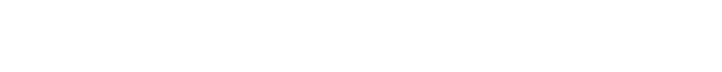

In [ ]:
Audio(yes1, rate=sr_yes1)

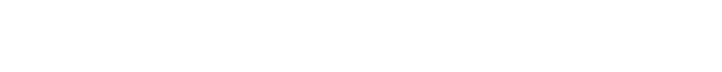

In [ ]:
Audio(yes2, rate=sr_yes2)

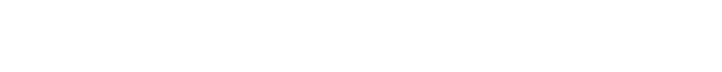

In [ ]:
Audio(yes3, rate=sr_yes3)

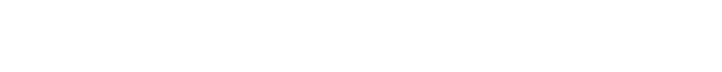

In [ ]:
Audio(yes4, rate=sr_yes4)

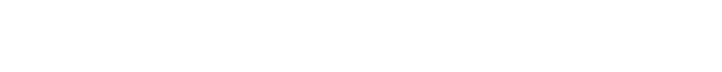

In [ ]:
Audio(no1, rate=sr_no1)

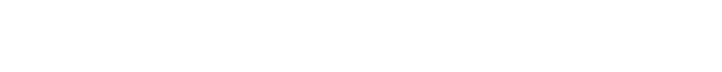

In [ ]:
Audio(no2, rate=sr_no2)

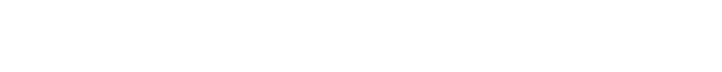

In [ ]:
Audio(no3, rate=sr_no3)

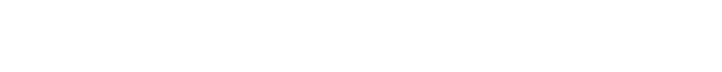

In [ ]:
Audio(no4, rate=sr_no4)

### Test the model on the Example Files
We first need to import a series of packages and build the loudest section tool so that we can process audio files manually to send them to our model. These packages will also be used later for you to record your own audio to test the model!

In [ ]:
# No Colab-specific audio imports are needed in the local environment.
# We will use librosa + scipy for preprocessing and the get_audio() function defined earlier for recording.
print('Local audio preprocessing tools are ready.')

Local audio preprocessing tools are ready.


In [ ]:
def _audio_to_float_mono(audio):
    """Convert an audio array to mono float32 in approximately [-1, 1]."""
    audio = np.asarray(audio)
    if audio.ndim == 2:
        audio = audio.mean(axis=1)
    audio = audio.astype(np.float32)
    max_abs = np.max(np.abs(audio)) if audio.size else 0.0
    if max_abs > 1.5:
        audio = audio / max_abs
    return audio

def extract_loudest_one_second(
    audio,
    sr,
    output_path="./assets/trimmed/custom_audio.wav",
    target_sr=16000,
):  # int16-like input
    """
    Pure-Python replacement for the original extract_loudest_section utility.

    It resamples the audio to 16 kHz, finds the 1-second window with highest
    energy, writes that segment to a WAV file, and returns the output path.
    """
    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)
    audio = _audio_to_float_mono(audio)
    if sr != target_sr:
        audio = librosa.resample(audio, orig_sr=sr, target_sr=target_sr)
    target_len = int(target_sr * 1.0)
    if len(audio) < target_len:
        audio = np.pad(audio, (0, target_len - len(audio)))
    energy = np.convolve(
        audio**2, np.ones(target_len, dtype=np.float32), mode="valid"
    )
    start = int(np.argmax(energy))
    segment = audio[start : start + target_len]
    max_abs = np.max(np.abs(segment)) if segment.size else 0.0
    if max_abs > 0:
        segment = 0.8 * segment / max_abs
    scipy.io.wavfile.write(
        output_path, target_sr, np.int16(segment * 32767)
    )
    return str(output_path)

print("Pure-Python loudest 1-second extractor is ready.")

Pure-Python loudest 1-second extractor is ready.


In [ ]:
# Helper function to run inference on a single input file/sample.
# This version avoids Linux-only build commands and works in the local class environment.

def run_tflite_inference_singleFile(
    tflite_model_path, custom_audio, sr_custom_audio, model_type="Float"
):
    # Extract the loudest 1-second segment and save it as a 16 kHz WAV file.
    trimmed_wav_path = extract_loudest_one_second(
        custom_audio,
        sr_custom_audio,
        output_path="./assets/trimmed/custom_audio.wav",
        target_sr=SAMPLE_RATE,
    )

    # Pass the WAV through the same speech_commands feature extraction pipeline. We use an ISOLATED graph here so we don't bloat the global graph on every call!
    with tf.Graph().as_default(), tf.compat.v1.Session() as sess:
        custom_audio_processor = input_data.AudioProcessor(
            None, None, 0, 0, "", 0, 0, model_settings, None
        )
        custom_audio_preprocessed = (
            custom_audio_processor.get_features_for_wav(
                trimmed_wav_path,
                model_settings,
                sess,
            )
        )

    # Reshape the feature vector into the model input shape.
    custom_audio_input = custom_audio_preprocessed[0].flatten()
    test_data = np.reshape(
        custom_audio_input, (1, len(custom_audio_input))
    ).astype(np.float32)

    # Initialize the TFLite interpreter.
    interpreter = tf.lite.Interpreter(tflite_model_path)
    interpreter.allocate_tensors()
    input_details = interpreter.get_input_details()[0]
    output_details = interpreter.get_output_details()[0]

    # For quantized models, manually quantize the input data.
    if model_type == "Quantized":
        input_scale, input_zero_point = input_details["quantization"]
        test_data = test_data / input_scale + input_zero_point
        test_data = test_data.astype(input_details["dtype"])

    # Run inference.
    interpreter.set_tensor(input_details["index"], test_data)
    interpreter.invoke()
    output = interpreter.get_tensor(output_details["index"])[0]
    top_prediction = output.argmax()

    # Translate the model output index.
    if top_prediction == 2 or top_prediction == 3:
        top_prediction_str = WANTED_WORDS.split(",")[top_prediction - 2]
    elif top_prediction == 0:
        top_prediction_str = "silence"
    else:
        top_prediction_str = "unknown"

    print(
        "%s model guessed the value to be %s"
        % (model_type, top_prediction_str)
    )
    return top_prediction_str, output

In [ ]:
# Then test the model - do they all work as you'd expect?
test_samples = [
    ("yes1", yes1, sr_yes1),
    ("yes2", yes2, sr_yes2),
    ("yes3", yes3, sr_yes3),
    ("yes4", yes4, sr_yes4),
    ("no1", no1, sr_no1),
    ("no2", no2, sr_no2),
    ("no3", no3, sr_no3),
    ("no4", no4, sr_no4),
]

for name, audio, sr in test_samples:
    print(f"Testing {name}")
    run_tflite_inference_singleFile(
        str(MODEL_TFLITE), audio, sr, model_type="Quantized"
    )

Testing yes1
Quantized model guessed the value to be yes
Testing yes2
Quantized model guessed the value to be no
Testing yes3
Quantized model guessed the value to be unknown
Testing yes4
Quantized model guessed the value to be yes
Testing no1
Quantized model guessed the value to be no
Testing no2
Quantized model guessed the value to be unknown
Testing no3
Quantized model guessed the value to be unknown
Testing no4
Quantized model guessed the value to be no


## Testing the model with your own data!

Try recording your own audio to test the model. You can experiment with different ways to say 'yes' and 'no'. Also, test the 'unknown' and 'silence' classes.

### Define the audio importing function

The local microphone recorder was already defined near the beginning of the notebook as `get_audio()`.

In [ ]:
print("Recorder available. Use custom_audio, sr_custom_audio = get_audio() in the next cell.")

Recorder available. Use custom_audio, sr_custom_audio = get_audio() in the next cell.


### Record your own audio and test the model

Run the next cell, press Enter when prompted, say either **yes** or **no**, and wait until the recording finishes.

Press Enter, then say one keyword clearly. Recording will last 1.5 seconds... yes
Recording...
Recording complete.
DONE


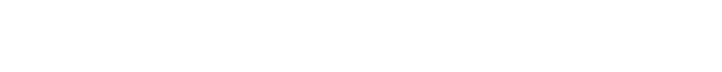

In [ ]:
custom_audio, sr_custom_audio = get_audio()
print("DONE")

In [ ]:
# Then test the model
run_tflite_inference_singleFile(str(MODEL_TFLITE), custom_audio, sr_custom_audio, model_type="Quantized")

Quantized model guessed the value to be yes


# Generate a TensorFlow Lite for Microcontrollers Model
To convert the TensorFlow Lite quantized model into a C source file that can be loaded by TensorFlow Lite for Microcontrollers on Arduino we simply need to use the ```xxd``` tool to convert the ```.tflite``` file into a ```.cc``` file.

In [ ]:
# The class environment runs on macOS/local Jupyter, so we do not use apt-get or xxd.
# The next cell exports the quantized TFLite model to a C/C++ source file using pure Python.

print("Ready to export the quantized TFLite model to kws.cc.")

Ready to export the quantized TFLite model to kws.cc.


In [ ]:
MODEL_TFLITE_MICRO_CPP = Path("kws.cc")  # C/C++ source file for Arduino
ARRAY_NAME = "g_model"

def tflite_to_c_array(
    tflite_path, output_path, array_name, bytes_per_line=12
):
    tflite_path = Path(tflite_path)
    output_path = Path(output_path)
    model_bytes = tflite_path.read_bytes()
    with output_path.open("w") as f:
        f.write(
            "// This file was generated from a quantized TensorFlow Lite model.\n"
        )
        f.write(
            "// Copy the byte array and length into micro_features_model.cpp if needed.\n\n"
        )
        f.write("#include <cstdint>\n\n")
        f.write(f"alignas(8) const unsigned char {array_name}[] = {{\n")
        for i in range(0, len(model_bytes), bytes_per_line):
            chunk = model_bytes[i : i + bytes_per_line]
            hex_values = ", ".join((f"0x{b:02x}" for b in chunk))
            f.write(f"  {hex_values},\n")
        f.write("};\n")
        f.write(f"const int {array_name}_len = {len(model_bytes)};\n")
    return len(model_bytes)

model_size = tflite_to_c_array(
    MODEL_TFLITE, MODEL_TFLITE_MICRO_CPP, ARRAY_NAME
)

print(f"Generated {MODEL_TFLITE_MICRO_CPP} from {MODEL_TFLITE}.")
print(f"Model size: {model_size} bytes.")
print(
    "Use g_model and g_model_len when updating the Arduino micro_features_model.cpp file."
)

Generated kws.cc from assets/models/model.tflite.
Model size: 18984 bytes.
Use g_model and g_model_len when updating the Arduino micro_features_model.cpp file.


That's it! You've successfully converted your TensorFlow Lite model into a TensorFlow Lite for Microcontrollers-compatible C/C++ array.

In the Arduino hardware step, copy the generated `g_model` byte array and `g_model_len` value from `kws.cc` into the corresponding model source file used by the provided Arduino example.

In [ ]:
# Preview the generated C/C++ model file without printing thousands of lines.
lines = MODEL_TFLITE_MICRO_CPP.read_text().splitlines()
print('\n'.join(lines[:14]))
print('\n... output shortened ...\n')
print('\n'.join(lines[-6:]))

// This file was generated from a quantized TensorFlow Lite model.
// Copy the byte array and length into micro_features_model.cpp if needed.

#include <cstdint>

alignas(8) const unsigned char g_model[] = {
  0x20, 0x00, 0x00, 0x00, 0x54, 0x46, 0x4c, 0x33, 0x00, 0x00, 0x00, 0x00,
  0x14, 0x00, 0x20, 0x00, 0x1c, 0x00, 0x18, 0x00, 0x14, 0x00, 0x10, 0x00,
  0x0c, 0x00, 0x00, 0x00, 0x08, 0x00, 0x04, 0x00, 0x14, 0x00, 0x00, 0x00,
  0x1c, 0x00, 0x00, 0x00, 0x1c, 0x00, 0x00, 0x00, 0x74, 0x00, 0x00, 0x00,
  0xd4, 0x42, 0x00, 0x00, 0xe4, 0x42, 0x00, 0x00, 0x88, 0x49, 0x00, 0x00,
  0x03, 0x00, 0x00, 0x00, 0x00, 0x00, 0x00, 0x00, 0x02, 0x00, 0x00, 0x00,
  0x34, 0x00, 0x00, 0x00, 0x04, 0x00, 0x00, 0x00, 0xdc, 0xff, 0xff, 0xff,
  0x0e, 0x00, 0x00, 0x00, 0x04, 0x00, 0x00, 0x00, 0x13, 0x00, 0x00, 0x00,

... output shortened ...

  0x0f, 0x00, 0x00, 0x00, 0x08, 0x00, 0x04, 0x00, 0x0c, 0x00, 0x00, 0x00,
  0x03, 0x00, 0x00, 0x00, 0x03, 0x00, 0x00, 0x00, 0x00, 0x00, 0x00, 0x03,
  0x0c, 0x00, 0x0c, 0x00,

If you'd like to download your model for safekeeping:

1. In JupyterLab, open the file browser on the left.
2. Find `kws.cc` in the same folder as this notebook.
3. Right-click `kws.cc` and select **Download**.